#                                                   **Insurance Renewal Prediction- GROUP 10**

 The Business problem that we are trying to solve:

 The insurance provider wants to predict customer renewal behavior.
  1. Customers buy insurance policies that are renewed on a yearly basis.
  2. Some customers renew (remain valuable customers), while others do not renew (loss of revenue).

  The goal is to use historical data (train.csv), which includes customer features (age, income, premium, payment history, claims, etc.) and their renewal status, to predict the renewal outcome for new or unseen customers (test.csv).

  This is needed because
  1. Retention vs Acquisition: Acquiring a new customer is costlier than retaining one. If the company can predict which customers are likely not to renew, they can proactively target them with retention offers.
  2. Revenue impact: Renewals directly contribute to recurring revenue and reduce churn.
  3. Resource optimization: Instead of contacting all customers, marketing teams can focus efforts on the segment predicted to churn.
  4. Customer satisfaction: Identifying dissatisfied customers early improves service, trust, and brand loyalty.

**Sources of Data**

Different organizations collect this data from multiple sources:
1. Internal Company Databases
CRM (Customer Relationship Management) system.
Policy administration system (policy details, premium, payment status).
Claims management system.
Customer support logs (emails, calls, complaints).

2. Marketing & Engagement Systems
Campaign response logs (clicks, email opens, calls answered).
Loyalty programs, app usage, website logins.

3. Third-Party Data Providers
Credit bureau data (credit score, repayment reliability).
Demographic enrichment (income bracket, household size, etc.).

4. External Sources
Macroeconomic indicators (inflation, unemployment — can affect renewals).
Social media sentiment (customer dissatisfaction can show up here).

**Source of data:**

https://www.kaggle.com/code/gauravduttakiit/insurance-renewal-prediction-lazypredict/notebook

**IMPORT LIBRARIES**

In [ ]:
# --- Imports ---
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
import plotly.subplots as sp
import plotly.graph_objects as go
import plotly.express as px

from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.svm import SVC, LinearSVC
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
import xgboost as xgb

from sklearn.metrics import (
    accuracy_score, precision_score, recall_score,
    f1_score, roc_auc_score, roc_curve, confusion_matrix
)

from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler, SMOTE

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, callbacks

In [ ]:
# Display
pd.set_option("display.max_columns", 150)
sns.set_theme(context="notebook")
plt.rcParams["figure.figsize"] = (8, 5)

In [ ]:
# Config
# Set target column name here.
TARGET_COL = "renewal"

**IMPORT DATASET**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
df = pd.read_csv("/content/drive/My Drive/Colab Notebooks/train_ZoGVYWq.csv")
display(df.head())

,id,perc_premium_paid_by_cash_credit,age_in_days,Income,Count_3-6_months_late,Count_6-12_months_late,Count_more_than_12_months_late,application_underwriting_score,no_of_premiums_paid,sourcing_channel,residence_area_type,premium,renewal
0,110936,0.429,12058,355060,0.0,0.0,0.0,99.02,13,C,Urban,3300,1
1,41492,0.010,21546,315150,0.0,0.0,0.0,99.89,21,A,Urban,18000,1
2,31300,0.917,17531,84140,2.0,3.0,1.0,98.69,7,C,Rural,3300,0
3,19415,0.049,15341,250510,0.0,0.0,0.0,99.57,9,A,Urban,9600,1
4,99379,0.052,31400,198680,0.0,0.0,0.0,99.87,12,B,Urban,9600,1


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 79853 entries, 0 to 79852
Data columns (total 13 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   id                                79853 non-null  int64  
 1   perc_premium_paid_by_cash_credit  79853 non-null  float64
 2   age_in_days                       79853 non-null  int64  
 3   Income                            79853 non-null  int64  
 4   Count_3-6_months_late             79756 non-null  float64
 5   Count_6-12_months_late            79756 non-null  float64
 6   Count_more_than_12_months_late    79756 non-null  float64
 7   application_underwriting_score    76879 non-null  float64
 8   no_of_premiums_paid               79853 non-null  int64  
 9   sourcing_channel                  79853 non-null  object 
 10  residence_area_type               79853 non-null  object 
 11  premium                           79853 non-null  int64  
 12  rene

In [ ]:
df.describe()

,id,perc_premium_paid_by_cash_credit,age_in_days,Income,Count_3-6_months_late,Count_6-12_months_late,Count_more_than_12_months_late,application_underwriting_score,no_of_premiums_paid,premium,renewal
count,79853.000000,79853.000000,79853.000000,7.985300e+04,79756.000000,79756.000000,79756.000000,76879.000000,79853.000000,79853.000000,79853.000000
mean,57167.166368,0.314288,18846.696906,2.088472e+05,0.248671,0.078188,0.060008,99.067291,10.863887,10924.507533,0.937410
std,32928.970160,0.334915,5208.719136,4.965826e+05,0.691468,0.436507,0.312023,0.739799,5.170687,9401.676542,0.242226
min,2.000000,0.000000,7670.000000,2.403000e+04,0.000000,0.000000,0.000000,91.900000,2.000000,1200.000000,0.000000
25%,28640.000000,0.034000,14974.000000,1.080100e+05,0.000000,0.000000,0.000000,98.810000,7.000000,5400.000000,1.000000
50%,57262.000000,0.167000,18625.000000,1.665600e+05,0.000000,0.000000,0.000000,99.210000,10.000000,7500.000000,1.000000
75%,85632.000000,0.538000,22636.000000,2.520900e+05,0.000000,0.000000,0.000000,99.540000,14.000000,13800.000000,1.000000
max,114076.000000,1.000000,37602.000000,9.026260e+07,13.000000,17.000000,11.000000,99.890000,60.000000,60000.000000,1.000000


In [ ]:
missing_values = df.isnull().sum()
missing_values

,0
id,0
perc_premium_paid_by_cash_credit,0
age_in_days,0
Income,0
Count_3-6_months_late,97
Count_6-12_months_late,97
Count_more_than_12_months_late,97
application_underwriting_score,2974
no_of_premiums_paid,0
sourcing_channel,0


**PREPROCESSING**

In [ ]:
df

,id,perc_premium_paid_by_cash_credit,age_in_days,Income,Count_3-6_months_late,Count_6-12_months_late,Count_more_than_12_months_late,application_underwriting_score,no_of_premiums_paid,sourcing_channel,residence_area_type,premium,renewal
0,110936,0.429,12058,355060,0.0,0.0,0.0,99.02,13,C,Urban,3300,1
1,41492,0.010,21546,315150,0.0,0.0,0.0,99.89,21,A,Urban,18000,1
2,31300,0.917,17531,84140,2.0,3.0,1.0,98.69,7,C,Rural,3300,0
3,19415,0.049,15341,250510,0.0,0.0,0.0,99.57,9,A,Urban,9600,1
4,99379,0.052,31400,198680,0.0,0.0,0.0,99.87,12,B,Urban,9600,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
79848,48057,0.425,23367,224550,1.0,0.0,0.0,98.70,19,B,Urban,13800,1
79849,59012,0.704,19356,279150,1.0,0.0,1.0,99.42,12,A,Rural,28500,1
79850,77050,0.000,23372,305020,0.0,0.0,0.0,98.89,12,A,Rural,9600,1
79851,67225,0.398,22641,39330,0.0,0.0,0.0,98.68,8,A,Rural,5700,1


In [ ]:
# --- Data Preprocessing ---
# Separate categorical and numerical columns
num_cols = df.select_dtypes(include=[np.number]).columns.tolist()
cat_cols = df.select_dtypes(include=['object']).columns.tolist()

In [ ]:
def split_column_types(df):
    """
    Split DataFrame columns into numeric vs. non-numeric lists (using pandas dtype check).
    """
    numeric_cols = [c for c in df.columns if pd.api.types.is_numeric_dtype(df[c])]
    categorical_cols = [c for c in df.columns if not pd.api.types.is_numeric_dtype(df[c])]
    return numeric_cols, categorical_cols

**EXPLORATORY DATA ANALYSIS**

In [ ]:
#Splitting columns into numerical and categorical
numeric_cols, categorical_cols = split_column_types(df)
print("\nNumeric columns:", numeric_cols)
print("Categorical columns:", categorical_cols)


Numeric columns: ['id', 'perc_premium_paid_by_cash_credit', 'age_in_days', 'Income', 'Count_3-6_months_late', 'Count_6-12_months_late', 'Count_more_than_12_months_late', 'application_underwriting_score', 'no_of_premiums_paid', 'premium', 'renewal']
Categorical columns: ['sourcing_channel', 'residence_area_type']


In [ ]:
def histograms_numeric(df, numeric_cols, name="DATA", bins=50):
    """Histogram + KDE for all numeric columns (individually)."""
    if not numeric_cols:
        print(f"\n[Info] No numeric columns in {name} for histograms.")
        return
    print(f"\n=== Histograms (numeric) : {name} ===")
    for col in numeric_cols:
        plt.figure(figsize=(6, 3))
        sns.histplot(df[col].dropna(), kde=True, bins=bins)
        plt.title(f"Histogram: {col}")
        plt.tight_layout()
        plt.show()

**UNIVARIATE ANALYSIS**

In [ ]:
def countplots_categorical(df, categorical_cols, name="DATA", top_k=20):
    """
    Countplots for categorical columns.
    For high-cardinality features, group everything outside top_k as "__OTHER__".
    """
    if not categorical_cols:
        print(f"\n[Info] No categorical columns in {name} for countplots.")
        return
    print(f"\n=== Countplots (categorical) : {name} ===")
    for col in categorical_cols:
        plt.figure(figsize=(7, 3))
        top_levels = df[col].value_counts().head(top_k).index
        sns.countplot(x=df[col].where(df[col].isin(top_levels), other="__OTHER__"))
        plt.title(f"Countplot: {col} (top {top_k} levels; others grouped)")
        plt.xticks(rotation=90)
        plt.tight_layout()
        plt.show()


=== Histograms (numeric) : TRAIN ===


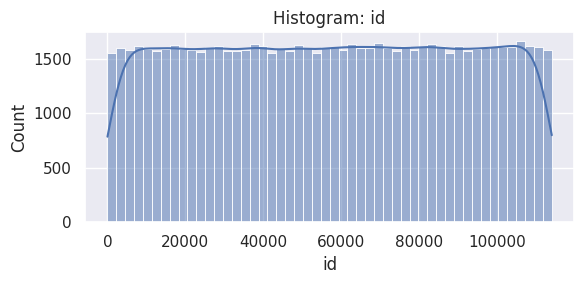

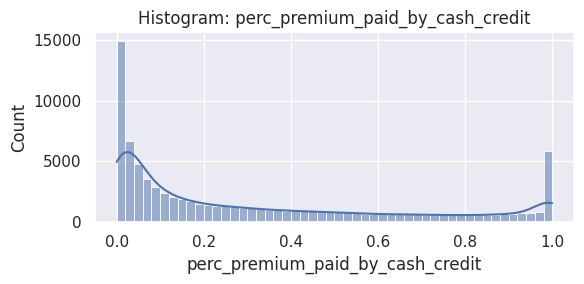

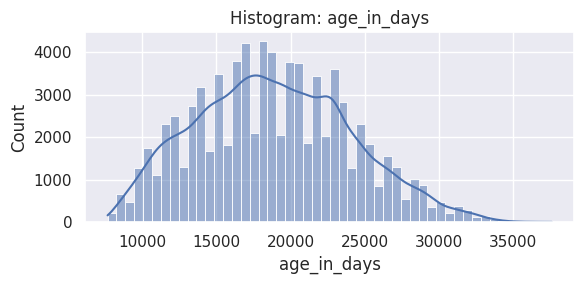

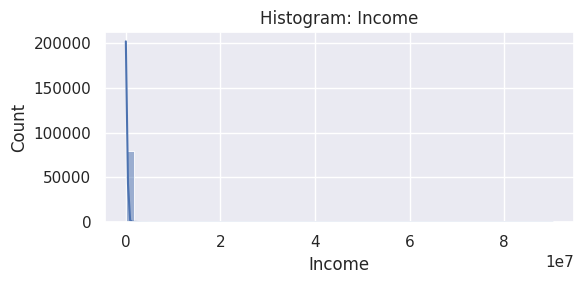

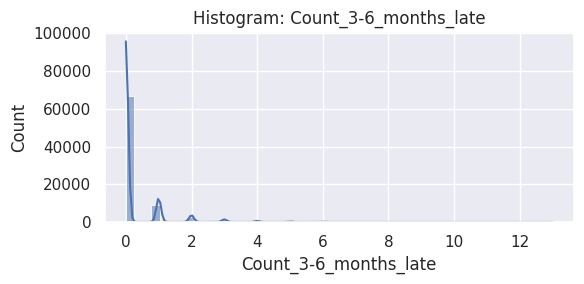

...

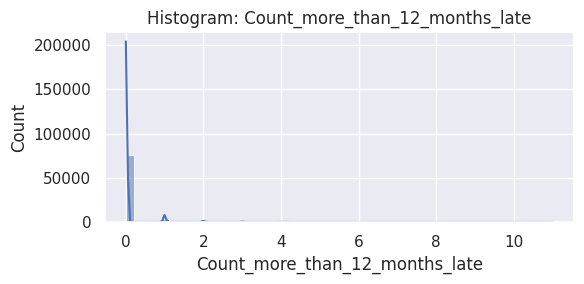

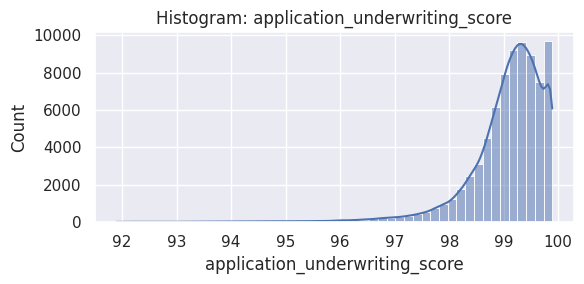

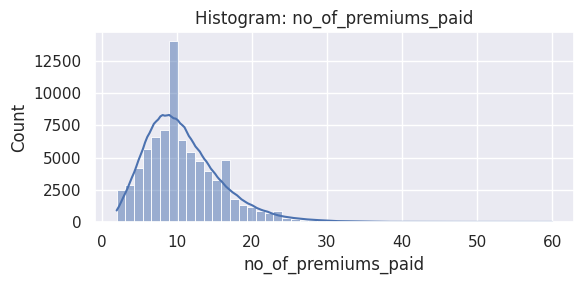

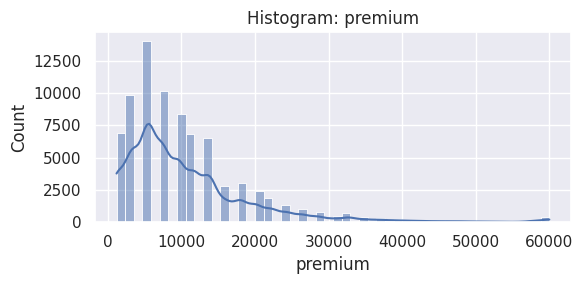

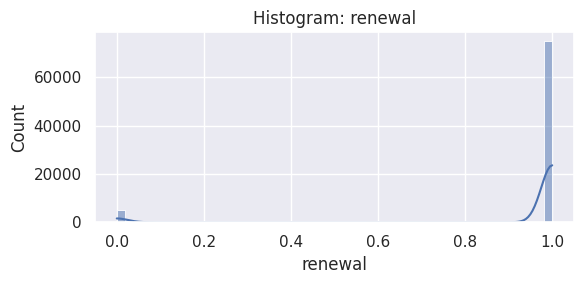


=== Countplots (categorical) : TRAIN ===


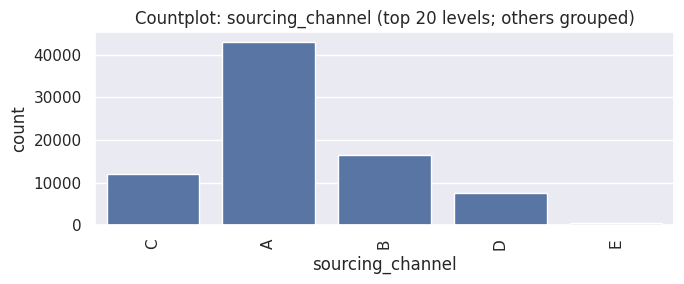

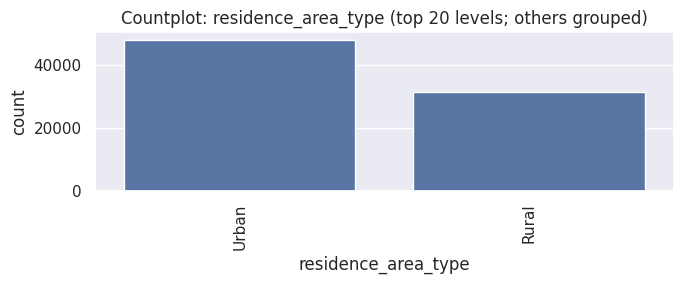

In [ ]:
# ============================================================
#                     UNIVARIATE PLOTS
# ============================================================
histograms_numeric(df, numeric_cols, "TRAIN")
countplots_categorical(df, categorical_cols, "TRAIN", top_k=20)

**BIVARIATE ANALYSIS**


 Bivariate: Target vs Categorical (Mean Target)


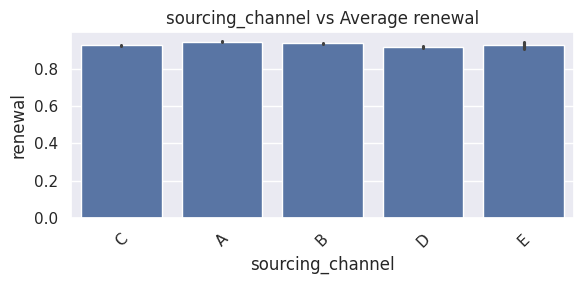

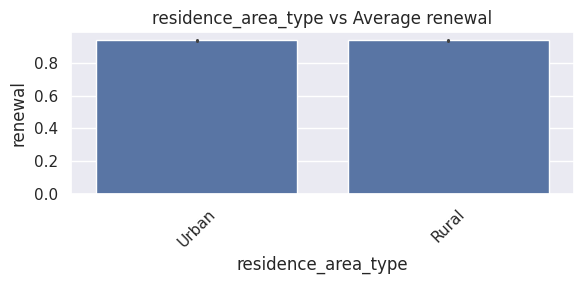

In [ ]:
# ============================================================
#               BIVARIATE: CATEGORICAL vs TARGET
# ============================================================
if TARGET_COL in df.columns:
    print("\n Bivariate: Target vs Categorical (Mean Target)")
    # Plot ucategorical features
    low_card_cols = [c for c in categorical_cols if df[c].nunique() <= 15][:6]
    for col in low_card_cols:
        plt.figure(figsize=(6, 3))
        # seaborn barplot
        sns.barplot(x=col, y=TARGET_COL, data=df)
        plt.title(f"{col} vs Average {TARGET_COL}")
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()
else:
    print("Skipping categorical vs target (missing target).")

In [ ]:
num_cols

['id',
 'perc_premium_paid_by_cash_credit',
 'age_in_days',
 'Income',
 'Count_3-6_months_late',
 'Count_6-12_months_late',
 'Count_more_than_12_months_late',
 'application_underwriting_score',
 'no_of_premiums_paid',
 'premium',
 'renewal']

In [ ]:
cat_cols

['sourcing_channel', 'residence_area_type']

In [ ]:
# Handle missing numeric values
imputer_num = SimpleImputer(strategy='median')
df[num_cols] = imputer_num.fit_transform(df[num_cols])

In [ ]:
missing_values_final = df.isnull().sum()
missing_values_final

,0
id,0
perc_premium_paid_by_cash_credit,0
age_in_days,0
Income,0
Count_3-6_months_late,0
Count_6-12_months_late,0
Count_more_than_12_months_late,0
application_underwriting_score,0
no_of_premiums_paid,0
sourcing_channel,0


**FEATURE ENGINEERING**

In [ ]:

# Convert age from days → years
df['age_in_years'] = (df['age_in_days'] / 365).astype(int)

# --- 1. Equal-width bins (example: 5-year groups) ---
df['age_bucket_width'] = pd.cut(df['age_in_years'], bins=np.arange(18, 81, 5), right=False)

# --- 2. Quantile-based bins (optimized by distribution) ---
df['age_bucket_quantile'] = pd.qcut(df['age_in_years'], q=5, duplicates='drop')

# --- 3. Tree-based binning (optimal splits using DecisionTree) ---
X_age = df[['age_in_years']]
y = df[TARGET_COL]

tree = DecisionTreeClassifier(max_leaf_nodes=5, random_state=42)  # 5 optimal buckets
tree.fit(X_age, y)

# Get split points
thresholds = sorted(tree.tree_.threshold[tree.tree_.threshold > 0])
bins = [df['age_in_years'].min()] + thresholds + [df['age_in_years'].max()]

df['age_bucket_tree'] = pd.cut(df['age_in_years'], bins=bins, include_lowest=True)

# --- Inspect ---
print(df[['age_in_years', 'age_bucket_width', 'age_bucket_quantile', 'age_bucket_tree']].head(20))


    age_in_years age_bucket_width age_bucket_quantile age_bucket_tree
0             33     [33.0, 38.0)      (20.999, 39.0]    (28.5, 35.5]
1             59     [58.0, 63.0)        (55.0, 64.0]    (56.5, 62.5]
2             48     [48.0, 53.0)        (47.0, 55.0]    (35.5, 56.5]
3             42     [38.0, 43.0)        (39.0, 47.0]    (35.5, 56.5]
4             86              NaN       (64.0, 103.0]   (62.5, 103.0]
5             48     [48.0, 53.0)        (47.0, 55.0]    (35.5, 56.5]
6             68     [68.0, 73.0)       (64.0, 103.0]   (62.5, 103.0]
7             60     [58.0, 63.0)        (55.0, 64.0]    (56.5, 62.5]
8             27     [23.0, 28.0)      (20.999, 39.0]  (20.999, 28.5]
9             63     [63.0, 68.0)        (55.0, 64.0]   (62.5, 103.0]
10            48     [48.0, 53.0)        (47.0, 55.0]    (35.5, 56.5]
11            44     [43.0, 48.0)        (39.0, 47.0]    (35.5, 56.5]
12            45     [43.0, 48.0)        (39.0, 47.0]    (35.5, 56.5]
13            54    

In [ ]:
# --- Step 1: Detect interval dtype columns (explicit list of names) ---
interval_cols = ['age_bucket_width', 'age_bucket_quantile', 'age_bucket_tree']

# --- Step 2: Convert intervals to string labels ---
for col in interval_cols:
    if col in df.columns:  # ensure column exists
        df[col] = df[col].astype(str)

# --- Step 3: Apply One-Hot Encoding ---
df = pd.get_dummies(df, columns=interval_cols, drop_first=True)




In [ ]:
df

,id,perc_premium_paid_by_cash_credit,age_in_days,Income,Count_3-6_months_late,Count_6-12_months_late,Count_more_than_12_months_late,application_underwriting_score,no_of_premiums_paid,sourcing_channel,residence_area_type,premium,renewal,age_in_years,"age_bucket_width_[23, 28)","age_bucket_width_[28, 33)","age_bucket_width_[33, 38)","age_bucket_width_[38, 43)","age_bucket_width_[43, 48)","age_bucket_width_[48, 53)","age_bucket_width_[53, 58)","age_bucket_width_[58, 63)","age_bucket_width_[63, 68)","age_bucket_width_[68, 73)","age_bucket_width_[73, 78)",age_bucket_width_nan,"age_bucket_quantile_(39.0, 47.0]","age_bucket_quantile_(47.0, 55.0]","age_bucket_quantile_(55.0, 64.0]","age_bucket_quantile_(64.0, 103.0]","age_bucket_tree_(28.5, 35.5]","age_bucket_tree_(35.5, 56.5]","age_bucket_tree_(56.5, 62.5]","age_bucket_tree_(62.5, 103.0]"
0,110936.0,0.429,12058.0,355060.0,0.0,0.0,0.0,99.02,13.0,C,Urban,3300.0,1.0,33,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False
1,41492.0,0.010,21546.0,315150.0,0.0,0.0,0.0,99.89,21.0,A,Urban,18000.0,1.0,59,False,False,False,False,False,False,False,True,False,False,False,False,False,False,True,False,False,False,True,False
2,31300.0,0.917,17531.0,84140.0,2.0,3.0,1.0,98.69,7.0,C,Rural,3300.0,0.0,48,False,False,False,False,False,True,False,False,False,False,False,False,False,True,False,False,False,True,False,False
3,19415.0,0.049,15341.0,250510.0,0.0,0.0,0.0,99.57,9.0,A,Urban,9600.0,1.0,42,False,False,False,True,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False,False
4,99379.0,0.052,31400.0,198680.0,0.0,0.0,0.0,99.87,12.0,B,Urban,9600.0,1.0,86,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,True,False,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79848,48057.0,0.425,23367.0,224550.0,1.0,0.0,0.0,98.70,19.0,B,Urban,13800.0,1.0,64,False,False,False,False,False,False,False,False,True,False,False,False,False,False,True,False,False,False,False,True
79849,59012.0,0.704,19356.0,279150.0,1.0,0.0,1.0,99.42,12.0,A,Rural,28500.0,1.0,53,False,False,False,False,False,False,True,False,False,False,False,False,False,True,False,False,False,True,False,False
79850,77050.0,0.000,23372.0,305020.0,0.0,0.0,0.0,98.89,12.0,A,Rural,9600.0,1.0,64,False,False,False,False,False,False,False,False,True,False,False,False,False,False,True,False,False,False,False,True
79851,67225.0,0.398,22641.0,39330.0,0.0,0.0,0.0,98.68,8.0,A,Rural,5700.0,1.0,62,False,False,False,False,False,False,False,True,False,False,False,False,False,False,True,False,False,False,True,False


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 79853 entries, 0 to 79852
Data columns (total 34 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   id                                 79853 non-null  float64
 1   perc_premium_paid_by_cash_credit   79853 non-null  float64
 2   age_in_days                        79853 non-null  float64
 3   Income                             79853 non-null  float64
 4   Count_3-6_months_late              79853 non-null  float64
 5   Count_6-12_months_late             79853 non-null  float64
 6   Count_more_than_12_months_late     79853 non-null  float64
 7   application_underwriting_score     79853 non-null  float64
 8   no_of_premiums_paid                79853 non-null  float64
 9   sourcing_channel                   79853 non-null  object 
 10  residence_area_type                79853 non-null  object 
 11  premium                            79853 non-null  flo

In [ ]:
df['total_late_payments'] = (df['Count_3-6_months_late'] +
                             df['Count_6-12_months_late'] +
                             df['Count_more_than_12_months_late'])

In [ ]:
df.head()

,id,perc_premium_paid_by_cash_credit,age_in_days,Income,Count_3-6_months_late,Count_6-12_months_late,Count_more_than_12_months_late,application_underwriting_score,no_of_premiums_paid,sourcing_channel,residence_area_type,premium,renewal,age_in_years,"age_bucket_width_[23, 28)","age_bucket_width_[28, 33)","age_bucket_width_[33, 38)","age_bucket_width_[38, 43)","age_bucket_width_[43, 48)","age_bucket_width_[48, 53)","age_bucket_width_[53, 58)","age_bucket_width_[58, 63)","age_bucket_width_[63, 68)","age_bucket_width_[68, 73)","age_bucket_width_[73, 78)",age_bucket_width_nan,"age_bucket_quantile_(39.0, 47.0]","age_bucket_quantile_(47.0, 55.0]","age_bucket_quantile_(55.0, 64.0]","age_bucket_quantile_(64.0, 103.0]","age_bucket_tree_(28.5, 35.5]","age_bucket_tree_(35.5, 56.5]","age_bucket_tree_(56.5, 62.5]","age_bucket_tree_(62.5, 103.0]",total_late_payments
0,110936.0,0.429,12058.0,355060.0,0.0,0.0,0.0,99.02,13.0,C,Urban,3300.0,1.0,33,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,0.0
1,41492.0,0.010,21546.0,315150.0,0.0,0.0,0.0,99.89,21.0,A,Urban,18000.0,1.0,59,False,False,False,False,False,False,False,True,False,False,False,False,False,False,True,False,False,False,True,False,0.0
2,31300.0,0.917,17531.0,84140.0,2.0,3.0,1.0,98.69,7.0,C,Rural,3300.0,0.0,48,False,False,False,False,False,True,False,False,False,False,False,False,False,True,False,False,False,True,False,False,6.0
3,19415.0,0.049,15341.0,250510.0,0.0,0.0,0.0,99.57,9.0,A,Urban,9600.0,1.0,42,False,False,False,True,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False,False,0.0
4,99379.0,0.052,31400.0,198680.0,0.0,0.0,0.0,99.87,12.0,B,Urban,9600.0,1.0,86,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,True,False,False,False,True,0.0


In [ ]:
# Fill missing late payment counts with 0 (if not already handled)
late_payment_cols = ['Count_3-6_months_late',
                     'Count_6-12_months_late',
                     'Count_more_than_12_months_late']

df[late_payment_cols] = df[late_payment_cols].fillna(0)

# Create a weighted late payment score
# Weight idea: older late payments are worse
weights = {
    'Count_3-6_months_late': 1,
    'Count_6-12_months_late': 2,
    'Count_more_than_12_months_late': 3
}

df['late_payment_score'] = (
    df['Count_3-6_months_late'] * weights['Count_3-6_months_late'] +
    df['Count_6-12_months_late'] * weights['Count_6-12_months_late'] +
    df['Count_more_than_12_months_late'] * weights['Count_more_than_12_months_late']
)


In [ ]:
df

,id,perc_premium_paid_by_cash_credit,age_in_days,Income,Count_3-6_months_late,Count_6-12_months_late,Count_more_than_12_months_late,application_underwriting_score,no_of_premiums_paid,sourcing_channel,residence_area_type,premium,renewal,age_in_years,"age_bucket_width_[23, 28)","age_bucket_width_[28, 33)","age_bucket_width_[33, 38)","age_bucket_width_[38, 43)","age_bucket_width_[43, 48)","age_bucket_width_[48, 53)","age_bucket_width_[53, 58)","age_bucket_width_[58, 63)","age_bucket_width_[63, 68)","age_bucket_width_[68, 73)","age_bucket_width_[73, 78)",age_bucket_width_nan,"age_bucket_quantile_(39.0, 47.0]","age_bucket_quantile_(47.0, 55.0]","age_bucket_quantile_(55.0, 64.0]","age_bucket_quantile_(64.0, 103.0]","age_bucket_tree_(28.5, 35.5]","age_bucket_tree_(35.5, 56.5]","age_bucket_tree_(56.5, 62.5]","age_bucket_tree_(62.5, 103.0]",total_late_payments,late_payment_score
0,110936.0,0.429,12058.0,355060.0,0.0,0.0,0.0,99.02,13.0,C,Urban,3300.0,1.0,33,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,0.0,0.0
1,41492.0,0.010,21546.0,315150.0,0.0,0.0,0.0,99.89,21.0,A,Urban,18000.0,1.0,59,False,False,False,False,False,False,False,True,False,False,False,False,False,False,True,False,False,False,True,False,0.0,0.0
2,31300.0,0.917,17531.0,84140.0,2.0,3.0,1.0,98.69,7.0,C,Rural,3300.0,0.0,48,False,False,False,False,False,True,False,False,False,False,False,False,False,True,False,False,False,True,False,False,6.0,11.0
3,19415.0,0.049,15341.0,250510.0,0.0,0.0,0.0,99.57,9.0,A,Urban,9600.0,1.0,42,False,False,False,True,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False,False,0.0,0.0
4,99379.0,0.052,31400.0,198680.0,0.0,0.0,0.0,99.87,12.0,B,Urban,9600.0,1.0,86,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,True,False,False,False,True,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79848,48057.0,0.425,23367.0,224550.0,1.0,0.0,0.0,98.70,19.0,B,Urban,13800.0,1.0,64,False,False,False,False,False,False,False,False,True,False,False,False,False,False,True,False,False,False,False,True,1.0,1.0
79849,59012.0,0.704,19356.0,279150.0,1.0,0.0,1.0,99.42,12.0,A,Rural,28500.0,1.0,53,False,False,False,False,False,False,True,False,False,False,False,False,False,True,False,False,False,True,False,False,2.0,4.0
79850,77050.0,0.000,23372.0,305020.0,0.0,0.0,0.0,98.89,12.0,A,Rural,9600.0,1.0,64,False,False,False,False,False,False,False,False,True,False,False,False,False,False,True,False,False,False,False,True,0.0,0.0
79851,67225.0,0.398,22641.0,39330.0,0.0,0.0,0.0,98.68,8.0,A,Rural,5700.0,1.0,62,False,False,False,False,False,False,False,True,False,False,False,False,False,False,True,False,False,False,True,False,0.0,0.0


**OUTLIER TREATMENT**

In [ ]:
# Initialize a dictionary to store outlier counts
outlier_counts = {}

# Iterate through each numeric column and calculate outliers using IQR
for column in df.select_dtypes(include=['int64','float64']).columns:
    # Drop NaN values for accurate IQR calculation
    col_data = df[column].dropna()
    Q1 = col_data.quantile(0.25)
    Q3 = col_data.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = col_data[(col_data < lower_bound) | (col_data > upper_bound)]
    outlier_counts[column] = len(outliers)


# Convert the dictionary to a DataFrame for tabular display
outlier_table = pd.DataFrame(list(outlier_counts.items()), columns=["Column", "Outlier Count"])

# Display the table
print(outlier_table)


                              Column  Outlier Count
0                                 id              0
1   perc_premium_paid_by_cash_credit              0
2                        age_in_days             44
3                             Income           3428
4              Count_3-6_months_late          12955
5             Count_6-12_months_late           3925
6     Count_more_than_12_months_late           3718
7     application_underwriting_score           3784
8                no_of_premiums_paid           1426
9                            premium           4523
10                           renewal           4998
11                      age_in_years             44
12               total_late_payments          16208
13                late_payment_score          16208


In [ ]:

# List of features to plot
features = ['Income','application_underwriting_score','no_of_premiums_paid','premium','age_in_years','total_late_payments','Count_3-6_months_late','Count_6-12_months_late','Count_more_than_12_months_late',]

# Determine layout
num_features = len(features)
num_rows = (num_features + 1) // 2  # 2 columns

# Create subplot figure
fig = sp.make_subplots(rows=num_rows, cols=2, subplot_titles=features)

# Add box plots to subplots
for i, feature in enumerate(features):
    row = i // 2 + 1
    col = i % 2 + 1
    fig.add_trace(go.Box(y=df[feature], name=feature), row=row, col=col)

# Update layout
fig.update_layout(height=400*num_rows, width=2000, title_text="Box Plots in 2 Columns")
fig.show()


In [ ]:
#Plotting the distribution of Late Payment Columns as values are heavily skewed for 0

columns = {
    'Count_3-6_months_late': 'Number of Late Payments (3–6 months)',
    'Count_6-12_months_late': 'Number of Late Payments (6–12 months)',
    'Count_more_than_12_months_late': 'Number of Late Payments (12+ months)'
}

# Generate histograms
for col, label in columns.items():
    fig = px.histogram(
        df,
        x=col,
        nbins=13,
        title=f'Distribution of {col}',
        labels={col: label}
    )
    fig.update_layout(
        xaxis_title=label,
        yaxis_title='Frequency',
        bargap=0.1
    )
    fig.show()


In [ ]:
# Define binning strategy for late payment columns to avoid the skew to impact the performance of the ML model
binning_config = {
    'Count_3-6_months_late': {
        'bins': [-1, 0, 1, 2, 3, float('inf')],
        'labels': ['No Late Payment', 'Once', 'Twice', 'Thrice', 'Frequent']
    },
    'Count_6-12_months_late': {
        'bins': [-1, 0, 1, 2, 3, float('inf')],
        'labels': ['No Late Payment', 'Once', 'Twice', 'Thrice', 'Frequent']
    },
    'Count_more_than_12_months_late': {
        'bins': [-1, 0, 1, 2, 3, float('inf')],
        'labels': ['No Late Payment', 'Once', 'Twice', 'Thrice', 'Frequent']
    }
}



# Apply binning and display unique values without index
for col, config in binning_config.items():
    binned_col = f'{col}_binned'
    df[binned_col] = pd.cut(df[col], bins=config['bins'], labels=config['labels'])
    unique_combined = df[[col, binned_col]].drop_duplicates().sort_values(by=col)
    print(f"\nUnique values for {col} with binned categories:")
    print(unique_combined.to_string(index=False))


Unique values for Count_3-6_months_late with binned categories:
 Count_3-6_months_late Count_3-6_months_late_binned
                   0.0              No Late Payment
                   1.0                         Once
                   2.0                        Twice
                   3.0                       Thrice
                   4.0                     Frequent
                   5.0                     Frequent
                   6.0                     Frequent
                   7.0                     Frequent
                   8.0                     Frequent
                   9.0                     Frequent
                  10.0                     Frequent
                  11.0                     Frequent
                  12.0                     Frequent
                  13.0                     Frequent

Unique values for Count_6-12_months_late with binned categories:
 Count_6-12_months_late Count_6-12_months_late_binned
                    0.0            

In [ ]:
# Create a histogram to show the full distribution of the 'premium' column with outliers
fig = px.histogram(df, x='premium', nbins=100, title='Full Distribution of Premium Values',
                   labels={'premium': 'Premium Amount'}, marginal='box')

# Show the plot
fig.show()

In [ ]:
# Create a histogram to show the full distribution of the 'Income' column with outliers
fig = px.histogram(df, x='Income', nbins=100, title='Full Distribution of Income Values',
                   labels={'Income': 'Income'}, marginal='box')

# Show the plot
fig.show()

In [ ]:
# Create a histogram to show the full distribution of the 'application_underwriting_score' column with outliers
fig = px.histogram(df, x='application_underwriting_score', nbins=100, title='Full Distribution of application_underwriting_score Values',
                   labels={'application_underwriting_score': 'application_underwriting_score'}, marginal='box')

# Show the plot
fig.show()

In [ ]:
# Create a histogram to show the full distribution of the 'no_of_premiums_paid' column with outliers
fig = px.histogram(df, x='no_of_premiums_paid', nbins=100, title='Full Distribution of no_of_premiums_paid Values',
                   labels={'no_of_premiums_paid': 'no_of_premiums_paid'}, marginal='box')

# Show the plot
fig.show()

In [ ]:
# Create a histogram to show the full distribution of the 'age_in_days' column with outliers
fig = px.histogram(df, x='age_in_days', nbins=100, title='Full Distribution of age_in_days Values',
                   labels={'age_in_days': 'age_in_days'}, marginal='box')

# Show the plot
fig.show()

In [ ]:
# Function to cap outliers using IQR method
def cap_outliers_iqr(series):
    Q1 = series.quantile(0.25)
    Q3 = series.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return series.clip(lower=lower_bound, upper=upper_bound)

# Apply outlier capping
df['Income'] = cap_outliers_iqr(df['Income'])
df['premium'] = cap_outliers_iqr(df['premium'])
df['application_underwriting_score'] = cap_outliers_iqr(df['application_underwriting_score'])
df['no_of_premiums_paid'] = cap_outliers_iqr(df['no_of_premiums_paid'])
df['age_in_days'] = cap_outliers_iqr(df['age_in_days'])
df['age_in_years'] = cap_outliers_iqr(df['age_in_years'])

In [ ]:
df.shape

(79853, 39)

In [ ]:
# Create a histogram to show the full distribution of the 'premium' column after the removal of outliers
fig = px.histogram(df, x='premium', nbins=100, title='Full Distribution of Premium Values',
                   labels={'premium': 'Premium Amount'}, marginal='box')

# Show the plot
fig.show()

In [ ]:
# Create a histogram to show the full distribution of the 'Income' column without outliers
fig = px.histogram(df, x='Income', nbins=100, title='Full Distribution of Income Values',
                   labels={'Income': 'Income'}, marginal='box')

# Show the plot
fig.show()

In [ ]:
# Create a histogram to show the full distribution of the 'application_underwriting_score' column without outliers
fig = px.histogram(df, x='application_underwriting_score', nbins=100, title='Full Distribution of application_underwriting_score Values',
                   labels={'application_underwriting_score': 'application_underwriting_score'}, marginal='box')

# Show the plot
fig.show()

In [ ]:
# Create a histogram to show the full distribution of the 'no_of_premiums_paid' column without outliers
fig = px.histogram(df, x='no_of_premiums_paid', nbins=100, title='Full Distribution of no_of_premiums_paid Values',
                   labels={'no_of_premiums_paid': 'no_of_premiums_paid'}, marginal='box')

# Show the plot
fig.show()

In [ ]:
# Create a histogram to show the full distribution of the 'age_in_days' column without outliers
fig = px.histogram(df, x='age_in_days', nbins=100, title='Full Distribution of age_in_days Values',
                   labels={'age_in_days': 'age_in_days'}, marginal='box')

# Show the plot
fig.show()

In [ ]:
# Remove numeric late count columns
df = df.drop(columns=['Count_3-6_months_late','Count_6-12_months_late','Count_more_than_12_months_late'])

In [ ]:
# Initialize a dictionary to store outlier counts
outlier_counts = {}

# Iterate through each numeric column and calculate outliers using IQR
for column in df.select_dtypes(include=['int64','float64']).columns:
    # Drop NaN values for accurate IQR calculation
    col_data = df[column].dropna()
    Q1 = col_data.quantile(0.25)
    Q3 = col_data.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = col_data[(col_data < lower_bound) | (col_data > upper_bound)]
    outlier_counts[column] = len(outliers)


# Convert the dictionary to a DataFrame for tabular display
outlier_table = pd.DataFrame(list(outlier_counts.items()), columns=["Column", "Outlier Count"])

# Display the table
print(outlier_table)

                              Column  Outlier Count
0                                 id              0
1   perc_premium_paid_by_cash_credit              0
2                        age_in_days              0
3                             Income              0
4     application_underwriting_score              0
5                no_of_premiums_paid              0
6                            premium              0
7                            renewal           4998
8                       age_in_years              0
9                total_late_payments          16208
10                late_payment_score          16208


In [ ]:
# Drop ID (not useful for prediction)
df = df.drop(columns=['id'])


Top correlations with 'renewal':
renewal                             1.000000
age_in_days                         0.095154
age_in_years                        0.095151
application_underwriting_score      0.071112
Income                              0.060978
premium                             0.041946
no_of_premiums_paid                 0.025084
perc_premium_paid_by_cash_credit   -0.240980
total_late_payments                -0.353315
late_payment_score                 -0.359704
Name: renewal, dtype: float64


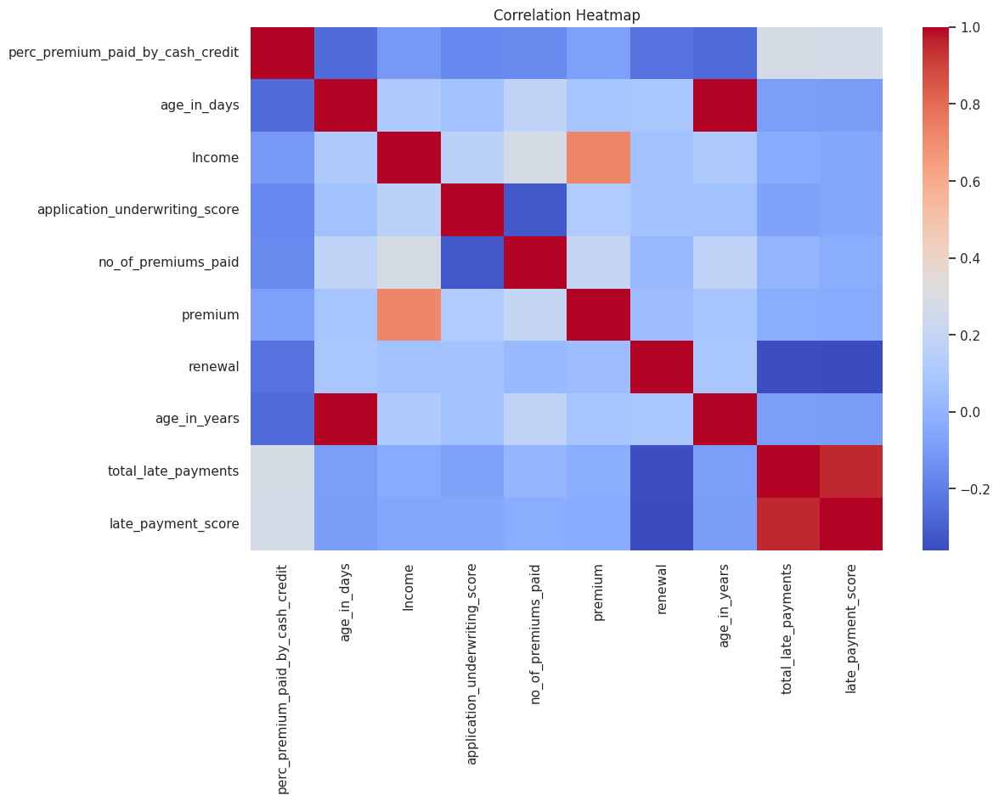

In [ ]:
# HEAT MAP
#Keep only numeric columns
numeric_df = df.select_dtypes(include=['int64', 'float64'])

# --- Basic Correlation Analysis (numeric only) ---
correlation_matrix = numeric_df.corr()

# Print top correlations with the target variable 'renewal'
if 'renewal' in correlation_matrix.columns:
    print("\nTop correlations with 'renewal':")
    print(correlation_matrix['renewal'].sort_values(ascending=False))

# --- Correlation Heatmap ---
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap')
plt.show()

In [ ]:
# Drop ID (not useful for prediction)
df = df.drop(columns=['Count_3-6_months_late_binned','Count_6-12_months_late_binned','Count_more_than_12_months_late_binned'])

In [ ]:
# Encode categorical variables
encoder = LabelEncoder()
for col in cat_cols:
    df[col] = encoder.fit_transform(df[col].astype(str))

In [ ]:
# Split features and target
X = df.drop(columns=[TARGET_COL])
y = df[TARGET_COL]

In [ ]:
# Recompute numeric columns for scaling
num_cols = X.select_dtypes(include=[np.number]).columns.tolist()

In [ ]:
# Scale numerical features
scaler = StandardScaler()
X[num_cols] = scaler.fit_transform(X[num_cols])

**DATA SPLITTING**

In [ ]:
# Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42, stratify=y
)

**SAMPLING METHODS**

In [ ]:

# --- Resampling Methods ---
samplers = {
    "UnderSampling": RandomUnderSampler(random_state=42),
    "OverSampling": RandomOverSampler(random_state=42),
    "SMOTE": SMOTE(random_state=42)
}

# Models to evaluate
models = {
    "LogisticRegression": LogisticRegression(max_iter=1000),
    "DecisionTree": DecisionTreeClassifier(random_state=42),
    "RandomForest": RandomForestClassifier(random_state=42)
}

In [ ]:
# Evaluation Function
def evaluate_model(model, X_train, y_train, X_test, y_test):
    """
    Fits model on training data, predicts on test data, and returns metrics.
    Automatically converts inputs to numpy arrays to avoid index misalignment.
    """
    # convert everything to arrays
    X_train = np.asarray(X_train)
    y_train = np.asarray(y_train)
    X_test  = np.asarray(X_test)
    y_test  = np.asarray(y_test)

    # fit and predict ---
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    # some models (like LinearSVC) don't have predict_proba
    if hasattr(model, "predict_proba"):
        y_proba = model.predict_proba(X_test)[:, 1]
    else:
        try:
            # fallback for decision_function (e.g., LinearSVC)
            y_proba = model.decision_function(X_test)
            y_proba = (y_proba - y_proba.min()) / (y_proba.max() - y_proba.min())  # normalize 0–1
        except Exception:
            y_proba = np.zeros_like(y_pred, dtype=float)

    # --- metrics ---
    return {
        "accuracy": accuracy_score(y_test, y_pred),
        "precision": precision_score(y_test, y_pred, zero_division=0),
        "recall": recall_score(y_test, y_pred, zero_division=0),
        "f1_score": f1_score(y_test, y_pred, zero_division=0),
        "roc_auc": roc_auc_score(y_test, y_proba) if len(np.unique(y_test)) == 2 else np.nan,
        "model": model,
        "y_pred": y_pred,
        "y_proba": y_proba
    }

In [ ]:
df

,perc_premium_paid_by_cash_credit,age_in_days,Income,application_underwriting_score,no_of_premiums_paid,sourcing_channel,residence_area_type,premium,renewal,age_in_years,"age_bucket_width_[23, 28)","age_bucket_width_[28, 33)","age_bucket_width_[33, 38)","age_bucket_width_[38, 43)","age_bucket_width_[43, 48)","age_bucket_width_[48, 53)","age_bucket_width_[53, 58)","age_bucket_width_[58, 63)","age_bucket_width_[63, 68)","age_bucket_width_[68, 73)","age_bucket_width_[73, 78)",age_bucket_width_nan,"age_bucket_quantile_(39.0, 47.0]","age_bucket_quantile_(47.0, 55.0]","age_bucket_quantile_(55.0, 64.0]","age_bucket_quantile_(64.0, 103.0]","age_bucket_tree_(28.5, 35.5]","age_bucket_tree_(35.5, 56.5]","age_bucket_tree_(56.5, 62.5]","age_bucket_tree_(62.5, 103.0]",total_late_payments,late_payment_score
0,0.429,12058.0,355060.0,99.02,13.0,2,1,3300.0,1.0,33.0,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,0.0,0.0
1,0.010,21546.0,315150.0,99.89,21.0,0,1,18000.0,1.0,59.0,False,False,False,False,False,False,False,True,False,False,False,False,False,False,True,False,False,False,True,False,0.0,0.0
2,0.917,17531.0,84140.0,98.69,7.0,2,0,3300.0,0.0,48.0,False,False,False,False,False,True,False,False,False,False,False,False,False,True,False,False,False,True,False,False,6.0,11.0
3,0.049,15341.0,250510.0,99.57,9.0,0,1,9600.0,1.0,42.0,False,False,False,True,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False,False,0.0,0.0
4,0.052,31400.0,198680.0,99.87,12.0,1,1,9600.0,1.0,86.0,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,True,False,False,False,True,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79848,0.425,23367.0,224550.0,98.70,19.0,1,1,13800.0,1.0,64.0,False,False,False,False,False,False,False,False,True,False,False,False,False,False,True,False,False,False,False,True,1.0,1.0
79849,0.704,19356.0,279150.0,99.42,12.0,0,0,26400.0,1.0,53.0,False,False,False,False,False,False,True,False,False,False,False,False,False,True,False,False,False,True,False,False,2.0,4.0
79850,0.000,23372.0,305020.0,98.89,12.0,0,0,9600.0,1.0,64.0,False,False,False,False,False,False,False,False,True,False,False,False,False,False,True,False,False,False,False,True,0.0,0.0
79851,0.398,22641.0,39330.0,98.68,8.0,0,0,5700.0,1.0,62.0,False,False,False,False,False,False,False,True,False,False,False,False,False,False,True,False,False,False,True,False,0.0,0.0


**MODEL TRAINING AND EVALUATION AFTER SAMPLING**

In [ ]:

# Store results
results = {}

# Train & Evaluate across samplers and models ---
for sampler_name, sampler in samplers.items():
    X_res, y_res = sampler.fit_resample(X_train, y_train)
    for model_name, model in models.items():
        key = f"{sampler_name}_{model_name}"
        results[key] = evaluate_model(model, X_res, y_res, X_test, y_test)

In [ ]:

# Summary Table
summary = pd.DataFrame({
    key: {metric: val for metric, val in res.items() if metric not in ["model","y_pred","y_proba"]}
    for key, res in results.items()
}).T

print("\nModel Performance Summary:\n")
print(summary)


Model Performance Summary:

                                  accuracy  precision    recall  f1_score  \
UnderSampling_LogisticRegression  0.779846   0.978342  0.782473  0.869514   
UnderSampling_DecisionTree        0.672859   0.967033  0.673999  0.794353   
UnderSampling_RandomForest        0.756637   0.977650  0.757715  0.853745   
OverSampling_LogisticRegression   0.783895   0.978193  0.787015  0.872252   
OverSampling_DecisionTree         0.898564   0.946413  0.945318  0.945865   
OverSampling_RandomForest         0.934964   0.947612  0.985083  0.965984   
SMOTE_LogisticRegression          0.806228   0.974182  0.814891  0.887445   
SMOTE_DecisionTree                0.883370   0.949235  0.925057  0.936990   
SMOTE_RandomForest                0.925154   0.951731  0.969319  0.960445   

                                   roc_auc  
UnderSampling_LogisticRegression  0.835584  
UnderSampling_DecisionTree        0.664885  
UnderSampling_RandomForest        0.827376  
OverSampling_Logisti

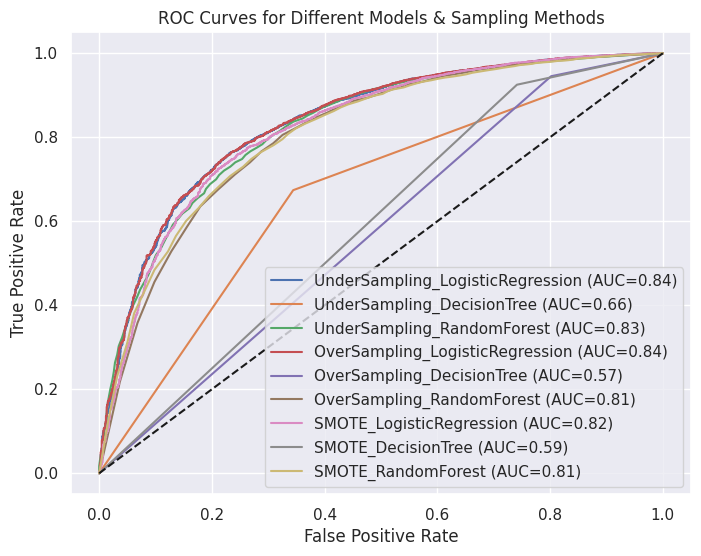

In [ ]:

# --- Plot ROC Curves ---
plt.figure(figsize=(8,6))
for key, res in results.items():
    fpr, tpr, _ = roc_curve(y_test, res["y_proba"])
    plt.plot(fpr, tpr, label=f"{key} (AUC={res['roc_auc']:.2f})")

plt.plot([0,1], [0,1], 'k--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curves for Different Models & Sampling Methods")
plt.legend()
plt.show()

**HYPERPARAMETER TUNING**

In [ ]:
# Hyperparameter Tuning for Random Forest (best sampler: SMOTE as example) ---
X_res, y_res = samplers["SMOTE"].fit_resample(X_train, y_train)

param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5]
}

grid = GridSearchCV(RandomForestClassifier(random_state=42),
                    param_grid, cv=3, scoring='roc_auc', n_jobs=-1)
grid.fit(X_res, y_res)

best_rf = grid.best_estimator_
print("\nBest Random Forest Params:", grid.best_params_)


Best Random Forest Params: {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 200}


In [ ]:
# --- Evaluate Best Model ---
best_res = evaluate_model(best_rf, X_res, y_res, X_test, y_test)
print("\nBest RF Performance on Test Set:\n", {k:v for k,v in best_res.items() if k not in ["model","y_pred","y_proba"]})



Best RF Performance on Test Set:
 {'accuracy': 0.9260310569377191, 'precision': 0.9516967288291043, 'recall': 0.9703433227946743, 'f1_score': 0.9609295762226044, 'roc_auc': np.float64(0.8146966838381189)}


In [ ]:
# --- Feature Importance ---
feature_importances = pd.Series(best_rf.feature_importances_, index=X.columns).sort_values(ascending=False)
print("\nTop 10 Features:\n", feature_importances.head(10))



Top 10 Features:
 late_payment_score                  0.140806
total_late_payments                 0.137100
perc_premium_paid_by_cash_credit    0.136918
age_in_days                         0.084171
no_of_premiums_paid                 0.084031
premium                             0.082768
age_in_years                        0.075305
application_underwriting_score      0.065387
Income                              0.064596
sourcing_channel                    0.057116
dtype: float64


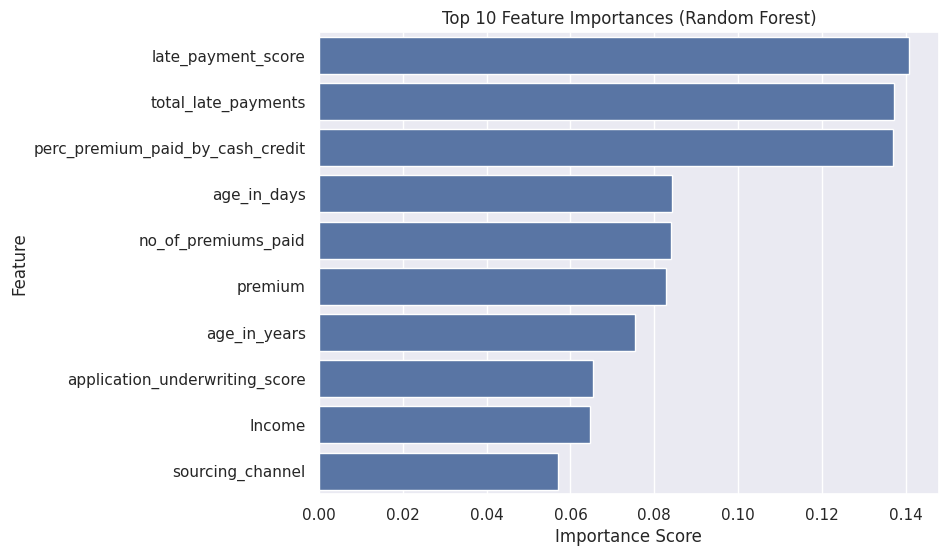

In [ ]:

# Plot Top 10 Features
plt.figure(figsize=(8,6))
sns.barplot(x=feature_importances.head(10), y=feature_importances.head(10).index)
plt.title("Top 10 Feature Importances (Random Forest)")
plt.xlabel("Importance Score")
plt.ylabel("Feature")
plt.show()


In [ ]:
# Clean feature names for XGBoost compatibility
X_train_xgb = X_train.copy()
X_test_xgb = X_test.copy()
X_train_xgb.columns = [str(c).replace("[","(").replace("]",")").replace("<","lt") for c in X_train_xgb.columns]
X_test_xgb.columns  = [str(c).replace("[","(").replace("]",")").replace("<","lt") for c in X_test_xgb.columns]


**ADDING MORE ALGORITHMS TO THE MODEL**


Model Performance Summary:

                    accuracy  precision    recall  f1_score   roc_auc
RandomForest        0.926949   0.951822  0.971234  0.961430  0.816454
XGBoost             0.909751   0.955965  0.947366  0.951646  0.796316
DecisionTree        0.859075   0.962704  0.883911  0.921627  0.762811
KNN                 0.809985   0.960923  0.831099  0.891309  0.717980
LogisticRegression  0.806228   0.974182  0.814891  0.887445  0.823971
LinearSVC           0.804851   0.973480  0.814000  0.886625  0.821316
NaiveBayes          0.631783   0.973604  0.624126  0.760644  0.761015


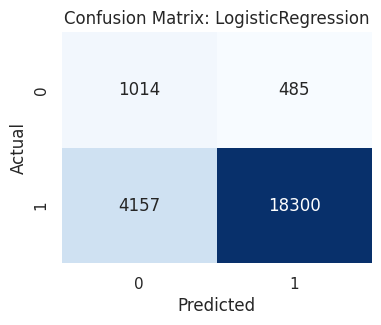

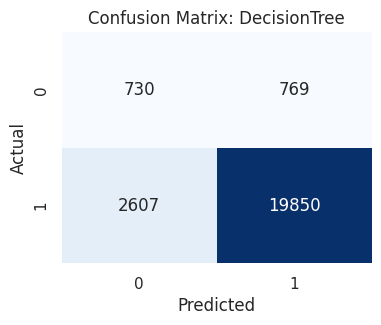

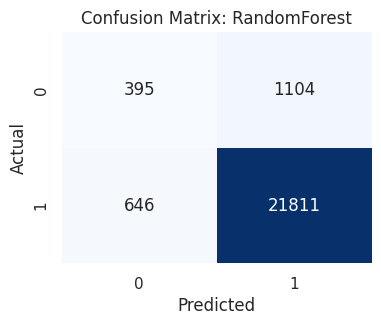

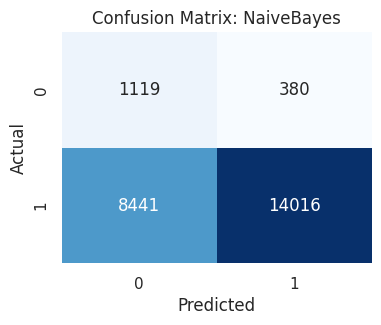

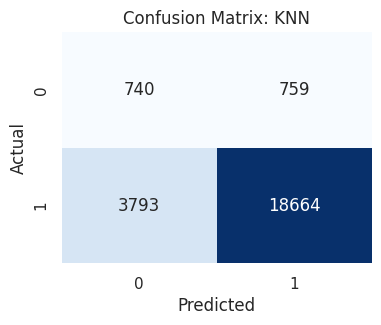

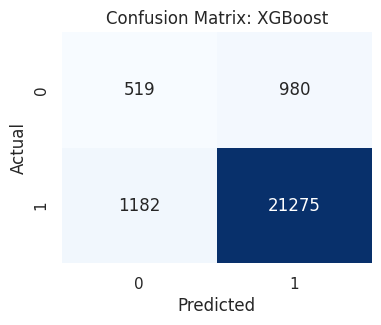

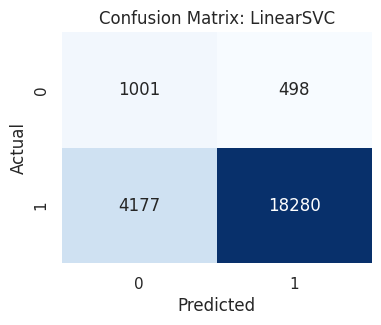

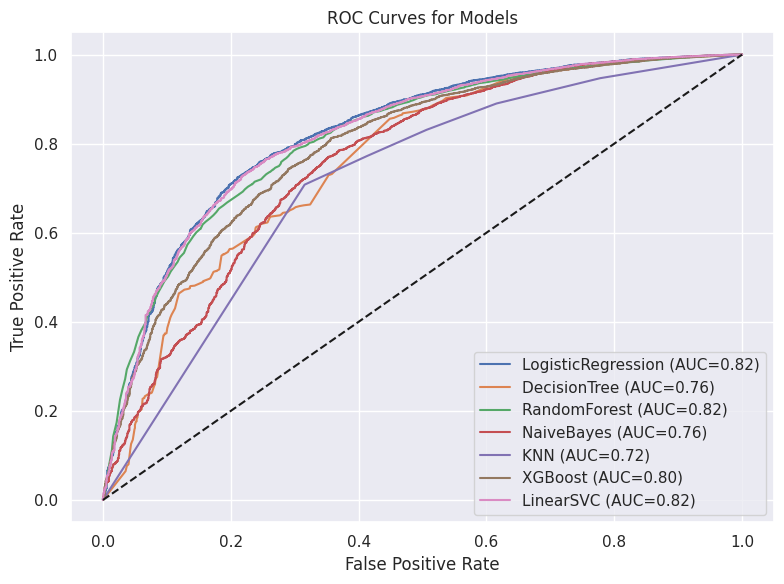

In [ ]:
# Optimized Models
models = {
    "LogisticRegression": LogisticRegression(max_iter=500, solver="lbfgs"),
    "DecisionTree": DecisionTreeClassifier(max_depth=10, random_state=42),
    "RandomForest": RandomForestClassifier(
        n_estimators=400, max_depth=40, random_state=42, n_jobs=-1
    ),
    "NaiveBayes": GaussianNB(),
    "KNN": KNeighborsClassifier(n_neighbors=5),
    "XGBoost": xgb.XGBClassifier(
        n_estimators=1000,
        max_depth=40,
        learning_rate=0.05,
        subsample=0.8,
        colsample_bytree=0.8,
        scale_pos_weight=(y_train.value_counts()[0] / y_train.value_counts()[1]),
        eval_metric="logloss",
        random_state=42,
        n_jobs=-1
    ),
    "LinearSVC": LinearSVC(max_iter=2000, random_state=42)
}

# Apply SMOTE only on training data
sm = SMOTE(random_state=42)
X_bal, y_bal = sm.fit_resample(X_train, y_train)

# Convert back to DataFrame + reset indices
X_bal = pd.DataFrame(X_bal, columns=X_train.columns).reset_index(drop=True)
y_bal = pd.Series(y_bal, name=TARGET_COL).reset_index(drop=True)
y_test = y_test.reset_index(drop=True)

# Evaluate all models
results = {}
for model_name, model in models.items():
    try:
        res = evaluate_model(model, X_bal, y_bal, X_test, y_test)
        results[model_name] = res
    except Exception as e:
        print(f"[Skip] {model_name} failed: {e}")

# Summary Table
summary = pd.DataFrame({
    key: {metric: val for metric, val in res.items() if metric not in ["model","y_pred","y_proba"]}
    for key, res in results.items()
}).T

print("\nModel Performance Summary:\n")
if not summary.empty and "f1_score" in summary.columns:
    print(summary.sort_values("f1_score", ascending=False))
else:
    print("No valid model results found — check previous errors.")

# Confusion Matrices
for key, res in results.items():
    cm = confusion_matrix(y_test, res["y_pred"])
    plt.figure(figsize=(4, 3))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
    plt.title(f"Confusion Matrix: {key}")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

#ROC Curves
plt.figure(figsize=(8,6))
for key, res in results.items():
    ypb = res.get("y_proba", None)
    if ypb is not None and np.asarray(ypb).ndim == 1 and np.sum(ypb) > 0:
        fpr, tpr, _ = roc_curve(y_test, ypb)
        plt.plot(fpr, tpr, label=f"{key} (AUC={res.get('roc_auc', float('nan')):.2f})")
plt.plot([0,1],[0,1],'k--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curves for Models")
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
"""
# Hyper parameter tuning for Neural network, takes around 1 hour to execute, hence commenting out

!pip install keras-tuner -q
import keras_tuner as kt
from tensorflow import keras
from tensorflow.keras import layers, callbacks
from sklearn.utils.class_weight import compute_class_weight
def build_model(hp):
    model = keras.Sequential()
    model.add(layers.Input(shape=(Xtr.shape[1],)))

    # Tune number of hidden layers (1–3)
    for i in range(hp.Int('num_layers', 1, 3)):
        model.add(layers.Dense(
            units=hp.Int(f'units_{i}', min_value=64, max_value=512, step=64),
            activation=hp.Choice('activation', ['relu', 'tanh', 'leaky_relu'])
        ))
        model.add(layers.Dropout(hp.Float(f'dropout_{i}', 0.1, 0.5, step=0.1)))

    # Output layer
    model.add(layers.Dense(1, activation="sigmoid"))

    # Tune optimizer learning rate
    lr = hp.Choice('learning_rate', [1e-2, 1e-3, 1e-4])
    model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=lr),
        loss='binary_crossentropy',
        metrics=['accuracy', keras.metrics.AUC(name='auc')]
    )

    return model
classes = np.unique(ytr)
weights = compute_class_weight(class_weight='balanced', classes=classes, y=ytr)
class_weights = dict(zip(classes, weights))
print("Class Weights:", class_weights)

tuner = kt.Hyperband(
    build_model,
    objective=kt.Objective('val_auc', direction='max'),  # maximize ROC-AUC
    max_epochs=50,
    factor=3,
    directory='nn_tuning',
    project_name='insurance_nn_tuner'
)

early_stop = callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

tuner.search(
    Xtr, ytr,
    validation_split=0.15,
    epochs=50,
    batch_size=32,
    class_weight=class_weights,
    callbacks=[early_stop],
    verbose=1
)

best_hp = tuner.get_best_hyperparameters(num_trials=1)[0]
print("\nBest Hyperparameters Found:")
for param in best_hp.values.keys():
    print(f"  {param}: {best_hp.get(param)}")

best_model = tuner.hypermodel.build(best_hp)

history = best_model.fit(
    Xtr, ytr,
    validation_split=0.15,
    epochs=100,
    batch_size=32,
    class_weight=class_weights,
    callbacks=[early_stop],
    verbose=1
)

y_proba_nn = best_model.predict(Xte).ravel()
y_pred_nn  = (y_proba_nn >= 0.5).astype(int)

acc  = accuracy_score(yte, y_pred_nn)
prec = precision_score(yte, y_pred_nn)
rec  = recall_score(yte, y_pred_nn)
f1   = f1_score(yte, y_pred_nn)
auc  = roc_auc_score(yte, y_proba_nn)

print("\n=== Tuned Neural Network — Test Metrics ===")
print(f"Accuracy : {acc:.4f}")
print(f"Precision: {prec:.4f}")
print(f"Recall   : {rec:.4f}")
print(f"F1-score : {f1:.4f}")
print(f"ROC-AUC  : {auc:.4f}")

"""

'\n# Hyper parameter tuning for Neural network, takes around 1 hour to execute, hence commenting out\n\n!pip install keras-tuner -q\nimport keras_tuner as kt\nfrom tensorflow import keras\nfrom tensorflow.keras import layers, callbacks\nfrom sklearn.utils.class_weight import compute_class_weight\ndef build_model(hp):\n    model = keras.Sequential()\n    model.add(layers.Input(shape=(Xtr.shape[1],)))\n\n    # Tune number of hidden layers (1–3)\n    for i in range(hp.Int(\'num_layers\', 1, 3)):\n        model.add(layers.Dense(\n            units=hp.Int(f\'units_{i}\', min_value=64, max_value=512, step=64),\n            activation=hp.Choice(\'activation\', [\'relu\', \'tanh\', \'leaky_relu\'])\n        ))\n        model.add(layers.Dropout(hp.Float(f\'dropout_{i}\', 0.1, 0.5, step=0.1)))\n\n    # Output layer\n    model.add(layers.Dense(1, activation="sigmoid"))\n\n    # Tune optimizer learning rate\n    lr = hp.Choice(\'learning_rate\', [1e-2, 1e-3, 1e-4])\n    model.compile(\n        opt

In [ ]:
#Simple Neural Network

# Keras expects float features
Xtr = np.asarray(X_train, dtype=np.float32)   # for training
Xte = np.asarray(X_test,  dtype=np.float32)   # for testing

# Convert labels to numpy arrays
ytr = np.asarray(y_train)  # labels for training
yte = np.asarray(y_test)   # labels for testing

# labels are strings ("Renewed"/"Not Renewed"), map them to integers (0/1).
#loss functions expect numeric class ids.
if not np.issubdtype(ytr.dtype, np.number):
    unique_classes = np.unique(ytr)           # e.g., ['Not Renewed', 'Renewed']
    class_to_int = {c: i for i, c in enumerate(unique_classes)}  # map in a fixed order
    ytr = np.vectorize(class_to_int.get)(ytr) # apply mapping to train labels
    yte = np.vectorize(class_to_int.get)(yte) # apply mapping to test labels

# Determine if problem is binary or multiclass (needed to choose output layer + loss)
num_classes = len(np.unique(ytr))             # number of unique labels in training set
is_binary = (num_classes == 2)                # True for binary classification

# Calculate Class Weights to handle imbalance (best practice alternative to SMOTE)
# This assigns higher importance to the minority class samples during training.
from sklearn.utils import class_weight
import numpy as np

# 'balanced' mode automatically calculates weights inversely proportional to class frequencies
# We use the training labels (ytr) to calculate the weights.
class_weights_array = class_weight.compute_class_weight(
    class_weight='balanced',
    classes=np.unique(ytr),
    y=ytr
)

# Convert the array to a dictionary required by Keras/TensorFlow
# The keys (0 and 1) correspond to the integer-mapped classes.
class_weight_dict = dict(enumerate(class_weights_array))

print(f"Calculated Class Weights: {class_weight_dict}")

Calculated Class Weights: {0: np.float64(7.987567876536153), 1: np.float64(0.5333886789572121)}


In [ ]:
# Build a  MLP (2 hidden layers)
#Start simple; 128->64 is a common, effective baseline for tabular data.
# Dropout helps reduce overfitting; ReLU is a good default for hidden layers.

model = keras.Sequential()                                        # plain stack of layers
model.add(layers.Input(shape=(Xtr.shape[1],)))                    # input size = number of features

# --- Layer 1 ---
model.add(layers.Dense(512))
model.add(layers.LeakyReLU(alpha=0.01))   # using leaky_relu activation
model.add(layers.Dropout(0.3))

# --- Layer 2 ---
model.add(layers.Dense(384))
model.add(layers.LeakyReLU(alpha=0.01))
model.add(layers.Dropout(0.4))

# --- Layer 3 ---
model.add(layers.Dense(384))
model.add(layers.LeakyReLU(alpha=0.01))
model.add(layers.Dropout(0.1))


# Output layer + loss depend on task type
if is_binary:
    model.add(layers.Dense(1, activation="sigmoid"))              # outputs probability of positive class
    loss_name = "binary_crossentropy"                             # standard loss for binary problems
    metrics_list = ["accuracy", keras.metrics.AUC(name="auc")]    # track accuracy + AUC during training
else:
    model.add(layers.Dense(num_classes, activation="softmax"))    # probability for each class
    loss_name = "sparse_categorical_crossentropy"                 # standard loss for multiclass with int labels
    metrics_list = ["accuracy"]                                   # AUC needs one-vs-rest setup; keep simple here

# Compile the model
# Adam with lr=1e-3 is a robust default
model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=0.0001),
    loss=loss_name,
    metrics=metrics_list
)

/usr/local/lib/python3.12/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning:

Argument `alpha` is deprecated. Use `negative_slope` instead.



In [ ]:
# Train the model
# validation_split reserves 15% of training data to monitor overfitting.
# EarlyStopping stops when val_loss stops improving (patience=10), restoring the best weights.
early_stop = callbacks.EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=True)

history = model.fit(
    Xtr, ytr,                       # training data
    validation_split=0.15,          # hold out part of training for validation
    epochs=50,                     # upper limit; usually stops earlier due to EarlyStopping
    batch_size=32,                 # larger batches = faster on tabular
    class_weight=class_weight_dict if is_binary else None, # <-- KEY CHANGE
    callbacks=[early_stop],
    verbose=1                       # show progress
)


Epoch 1/50
1485/1485 ━━━━━━━━━━━━━━━━━━━━ 13s 6ms/step - accuracy: 0.7331 - auc: 0.8086 - loss: 0.5503 - val_accuracy: 0.7070 - val_auc: 0.8206 - val_loss: 0.5555
Epoch 2/50
1485/1485 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.7458 - auc: 0.8315 - loss: 0.5157 - val_accuracy: 0.7345 - val_auc: 0.8205 - val_loss: 0.5115
Epoch 3/50
1485/1485 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.7548 - auc: 0.8351 - loss: 0.5069 - val_accuracy: 0.7760 - val_auc: 0.8230 - val_loss: 0.4395
Epoch 4/50
1485/1485 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.7599 - auc: 0.8434 - loss: 0.4955 - val_accuracy: 0.7401 - val_auc: 0.8230 - val_loss: 0.5104
Epoch 5/50
1485/1485 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.7624 - auc: 0.8493 - loss: 0.4819 - val_accuracy: 0.7664 - val_auc: 0.8249 - val_loss: 0.4779
Epoch 6/50
1485/1485 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.7583 - auc: 0.8418 - loss: 0.5031 - val_accuracy: 0.7507 - val_auc: 0.8234 - val_loss: 0.4753
Epoch 7/50
1485/1485 ━━━━━━

In [ ]:
#Get predictions on the test set
# For binary: model outputs a single probability per sample -> threshold at 0.5 to get class.
# For multiclass: model outputs a probability vector -> take argmax to get predicted class.
if is_binary:
    y_proba_nn = model.predict(Xte, verbose=0).ravel()            # shape (n,), values in [0,1]
    y_pred_nn  = (y_proba_nn >= 0.5).astype(int)                  # threshold at 0.5 to convert to 0/1
else:
    proba_mat  = model.predict(Xte, verbose=0)                    # shape (n, K)
    y_pred_nn  = np.argmax(proba_mat, axis=1)                     # class with highest probability
    y_proba_nn = proba_mat[:, 1] if proba_mat.shape[1] > 1 else proba_mat.ravel()

In [ ]:
#Compute simple test metrics
#accuracy = overall correct; precision/recall/F1 show balance; ROC-AUC summarizes ranking quality.
avg_type = "binary" if is_binary else "weighted"                  # use weighted for multiclass
acc  = accuracy_score(yte, y_pred_nn)
prec = precision_score(yte, y_pred_nn, average=avg_type, zero_division=0)
rec  = recall_score(yte, y_pred_nn, average=avg_type, zero_division=0)
f1   = f1_score(yte, y_pred_nn, average=avg_type, zero_division=0)
auc  = roc_auc_score(yte, y_proba_nn) if is_binary else None      #AUC only for binary here

print("\n=== Neural Network (Keras) — Test Metrics (Simple) ===")
print(f"Accuracy : {acc:.6f}")
print(f"Precision: {prec:.6f}")
print(f"Recall   : {rec:.6f}")
print(f"F1-score : {f1:.6f}")
print(f"ROC-AUC  : {auc:.6f}" if auc is not None else "ROC-AUC  : (only for binary)")


=== Neural Network (Keras) — Test Metrics (Simple) ===
Accuracy : 0.778135
Precision: 0.978987
Recall   : 0.780069
F1-score : 0.868281
ROC-AUC  : 0.840605


In [ ]:
# Add this model’s results into existing `results` dict
if "results" not in globals():
    results = {}

results["NeuralNet"] = {
    "accuracy": acc,
    "precision": prec,
    "recall": rec,
    "f1_score": f1,
    "roc_auc": auc,
    "model": model,
    "y_pred": y_pred_nn,
    "y_proba": y_proba_nn
}

# Rebuild and show the summary table (including NeuralNet)
summary = pd.DataFrame({
    key: {m: v for m, v in res.items() if m not in ["model", "y_pred", "y_proba"]}
    for key, res in results.items()
}).T

# Clean numeric formatting
summary = summary.astype(float).round(6)

# ============================================
# Combine ROC-AUC and F1 for ranking
# ============================================

w_roc = 0.5   # weight for ROC-AUC
w_f1  = 0.5   # weight for F1-score

summary["weighted_score"] = (
    w_roc * summary["roc_auc"] +
    w_f1  * summary["f1_score"]
)

# Sort by the combined metric
summary_sorted = summary.sort_values("weighted_score", ascending=False)

# ============================================
# Display Summary
# ============================================
print("\n=== Model Performance Summary (F1 + ROC-AUC Weighted) ===")
display(summary_sorted)

# Highlight Best Model
best_model_name = summary_sorted.index[0]
best_row = summary_sorted.iloc[0]
print(f"\nBest Model Based on Combined Metric: **{best_model_name}**")
print(f"   F1-score = {best_row['f1_score']:.4f},  ROC-AUC = {best_row['roc_auc']:.4f},  Weighted Score = {best_row['weighted_score']:.4f}")



=== Model Performance Summary (F1 + ROC-AUC Weighted) ===


,accuracy,precision,recall,f1_score,roc_auc,weighted_score
RandomForest,0.926949,0.951822,0.971234,0.961430,0.816454,0.888942
XGBoost,0.909751,0.955965,0.947366,0.951646,0.796316,0.873981
LogisticRegression,0.806228,0.974182,0.814891,0.887445,0.823971,0.855708
NeuralNet,0.778135,0.978987,0.780069,0.868281,0.840605,0.854443
LinearSVC,0.804851,0.973480,0.814000,0.886625,0.821316,0.853970
DecisionTree,0.859075,0.962704,0.883911,0.921627,0.762811,0.842219
KNN,0.809985,0.960923,0.831099,0.891309,0.717980,0.804644
NaiveBayes,0.631783,0.973604,0.624126,0.760644,0.761015,0.760830



Best Model Based on Combined Metric: **RandomForest**
   F1-score = 0.9614,  ROC-AUC = 0.8165,  Weighted Score = 0.8889


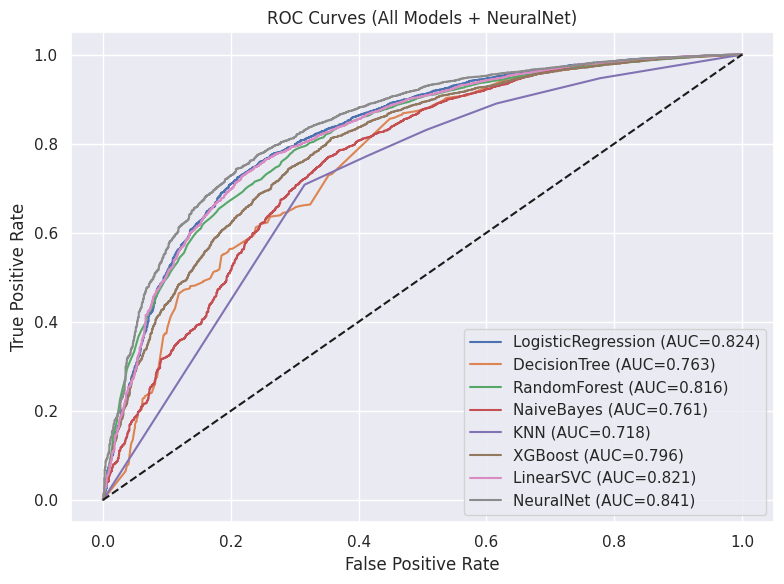

In [ ]:
# Plot ROC curves for all models that have 1-D probabilities
# useful visual to compare ranking quality across models; only valid for binary tasks.
if is_binary:
    plt.figure(figsize=(8, 6))
    for key, res in results.items():
        ypb = res.get("y_proba", None)
        if ypb is not None and np.asarray(ypb).ndim == 1:         # plot only for binary-style prob vectors
            fpr, tpr, _ = roc_curve(y_test, ypb)
            plt.plot(fpr, tpr, label=f"{key} (AUC={res.get('roc_auc', float('nan')):.3f})")
    plt.plot([0,1], [0,1], 'k--')                                 # random-guess line
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC Curves (All Models + NeuralNet)")
    plt.legend()
    plt.tight_layout()
    plt.show()

In [ ]:

# best model by F1 then ROC_AUC ---
best_model_name = summary.sort_values(
    ["f1_score", "roc_auc"], ascending=False
).index[0]

best_model = results[best_model_name]["model"]
print(f"Best model: {best_model_name}")
print(summary.loc[best_model_name])


Best model: RandomForest
accuracy          0.926949
precision         0.951822
recall            0.971234
f1_score          0.961430
roc_auc           0.816454
weighted_score    0.888942
Name: RandomForest, dtype: float64


In [ ]:
# --- Load New Test Data ---
test_df = pd.read_csv("/content/drive/My Drive/Colab Notebooks/test_66516Ee.csv")
display(test_df.head())

,id,perc_premium_paid_by_cash_credit,age_in_days,Income,Count_3-6_months_late,Count_6-12_months_late,Count_more_than_12_months_late,application_underwriting_score,no_of_premiums_paid,sourcing_channel,residence_area_type,premium
0,649,0.001,27384,51150,0.0,0.0,0.0,99.89,7,A,Rural,3300
1,81136,0.124,23735,285140,0.0,0.0,0.0,98.93,19,A,Urban,11700
2,70762,1.000,17170,186030,0.0,0.0,0.0,NaN,2,B,Urban,11700
3,53935,0.198,16068,123540,0.0,0.0,0.0,99.00,11,B,Rural,5400
4,15476,0.041,10591,200020,1.0,0.0,0.0,99.17,14,A,Rural,9600


In [ ]:
# ==========================
#   Predict on Test Data
# ==========================

# --- Preprocessing Function (same as training) ---
def preprocess_data(df, train_columns, scaler):
    df = df.copy()

    # Handle missing values
    df = df.fillna(0)

    # Feature engineering
    if "age_in_days" in df.columns:
        df["age_in_years"] = (df["age_in_days"] / 365).astype(int)

    late_payment_cols = ["Count_3-6_months_late",
                         "Count_6-12_months_late",
                         "Count_more_than_12_months_late"]

    for col in late_payment_cols:
        if col in df.columns:
            df[col] = df[col].fillna(0)

    if all(c in df.columns for c in late_payment_cols):
        df["total_late_payments"] = (
            df["Count_3-6_months_late"] +
            df["Count_6-12_months_late"] +
            df["Count_more_than_12_months_late"]
        )

        weights = {
            "Count_3-6_months_late": 1,
            "Count_6-12_months_late": 2,
            "Count_more_than_12_months_late": 3
        }
        df["late_payment_score"] = (
            df["Count_3-6_months_late"] * weights["Count_3-6_months_late"] +
            df["Count_6-12_months_late"] * weights["Count_6-12_months_late"] +
            df["Count_more_than_12_months_late"] * weights["Count_more_than_12_months_late"]
        )

    # Drop unused columns
    drop_cols = ["id", "Count_3-6_months_late", "Count_6-12_months_late", "Count_more_than_12_months_late"]
    df = df.drop(columns=[c for c in drop_cols if c in df.columns], errors="ignore")

    # Encode categorical variables
    cat_cols = df.select_dtypes(include=["object"]).columns
    encoder = LabelEncoder()
    for col in cat_cols:
        df[col] = encoder.fit_transform(df[col].astype(str))

    # Scale numeric features
    num_cols = df.select_dtypes(include=[np.number]).columns.tolist()
    df[num_cols] = scaler.transform(df[num_cols])

    # Align with train columns
    missing_cols = set(train_columns) - set(df.columns)
    for col in missing_cols:
        df[col] = 0
    df = df[train_columns]

    return df

# ==========================
#   Apply Preprocessing
# ==========================
X_test = preprocess_data(test_df, train_columns=X_train.columns, scaler=scaler)

# ==========================
#   Predict with Best Model
# ==========================

test_df["renewal_pred"] = best_model.predict(X_test)

# --- Save predictions ---
test_df[["id", "renewal_pred"]].to_csv("test_predictions.csv", index=False)
print("Predictions saved to test_predictions.csv")


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2732: UserWarning:

X has feature names, but RandomForestClassifier was fitted without feature names



Predictions saved to test_predictions.csv


In [ ]:
# Save only ID and prediction
test_df[["id", "renewal_pred"]].to_csv("test_predictions.csv", index=False)

print("Test predictions saved as test_predictions.csv")


Test predictions saved as test_predictions.csv


In [ ]:
# Save the full dataframe with predictions
output_path = "test_predictions.csv"
test_df.to_csv(output_path, index=False)

print("Full test DataFrame with predictions saved at:", output_path)


Full test DataFrame with predictions saved at: test_predictions.csv


In [ ]:
import joblib
import json

# 1) Save the best trained model (RandomForest)
joblib.dump(best_model, "best_model.pkl")

# 2) Save the fitted scaler used on numeric columns (the same scaler you used before train/test split)
joblib.dump(scaler, "scaler.pkl")

# 3) Save the exact training feature columns (for alignment during inference)
train_columns = list(X_train.columns)
with open("train_columns.json", "w") as f:
    json.dump(train_columns, f)

print("Exported: best_model.pkl, scaler.pkl, train_columns.json")


Exported: best_model.pkl, scaler.pkl, train_columns.json
